# Basic demonstration of fUSi analysis

This notebook shows the basic demonstration of analyzing audio data collected at UCLA


In [1]:
%load_ext autoreload
%autoreload 2

# import nilearn as nl
from nilearn import image
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn.plotting import plot_design_matrix
from scipy.io import savemat
from scipy.io import loadmat
import nibabel as nib
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML
from doc_utils_BIDS import DirectoryManager
import fusi_utils_BIDS as utils
import pickle
import os
import json

In [2]:
base_path = Path(
    "/Users/clairenastaskin/data/2025-03-14/run-01-audio/LambdaOver2/50mm_62mm/"
)
sequence = "sub-Forest001_ses-20250314_task-audio_run-01_acq-ec8749_proc-c5d7b0+6cff9f"
seq_type = "5cmto6cm"
smoothing_fwhm = (0.5) # 0 spatial smoothing in mm to apply to the data before computing GLM

dm = DirectoryManager(base_path, sequence)
dm.list_acquisition_directories()
dm.print_paths()

Directories in acquisitions path:
    streams
List of all directories in acquisitions path:
    log_file_path: /Users/clairenastaskin/data/2025-03-14/run-01-audio/LambdaOver2/50mm_62mm/logs/task.log
    task_event_file_path: /Users/clairenastaskin/data/2025-03-14/run-01-audio/LambdaOver2/50mm_62mm/streams/task-event_stream.h5
    probe_event_file_path: /Users/clairenastaskin/data/2025-03-14/run-01-audio/LambdaOver2/50mm_62mm/streams/probe-event_stream.h5
    power_doppler_path: /Users/clairenastaskin/data/2025-03-14/run-01-audio/LambdaOver2/50mm_62mm/sub-Forest001_ses-20250314_task-audio_run-01_acq-ec8749_proc-c5d7b0+6cff9f_pwd.nii.gz


In [3]:
probe_events = utils.extract_probe_events(dm.probe_event_file_path, seq_type)
power_doppler_path = dm.power_doppler_path
frame_indices = -1


# Load fUSI nifti file and get data into a numpy array
nifti_img = nib.load(power_doppler_path)
data = nifti_img.get_fdata()

# Check if all frame_indices are valid
if frame_indices == -1:
    frame_indices = list(range(len(probe_events)))
elif any(
    frame_index < 0 or frame_index >= data.shape[0] for frame_index in frame_indices
):
    raise ValueError("One or more invalid frame indices")

# Extract the requested frames
frames_data = data[:, :, :, frame_indices]

print(frames_data.shape)
fusi_data = frames_data
print(probe_events)

(113, 51, 55, 146)
              Event                           raw_file_name  acquisition_idx  \
0    ensemble_saved  ensemble_2025-03-14T19-02-53-657936.h5                0   
1    ensemble_saved  ensemble_2025-03-14T19-02-57-914843.h5                1   
2    ensemble_saved  ensemble_2025-03-14T19-03-02-156744.h5                2   
3    ensemble_saved  ensemble_2025-03-14T19-03-06-412979.h5                3   
4    ensemble_saved  ensemble_2025-03-14T19-03-10-672555.h5                4   
..              ...                                     ...              ...   
141  ensemble_saved  ensemble_2025-03-14T19-13-02-868192.h5              141   
142  ensemble_saved  ensemble_2025-03-14T19-13-07-224513.h5              142   
143  ensemble_saved  ensemble_2025-03-14T19-13-11-556673.h5              143   
144  ensemble_saved  ensemble_2025-03-14T19-13-15-857101.h5              144   
145  ensemble_saved  ensemble_2025-03-14T19-13-20-141666.h5              145   

     time_stamp  
0 

In [4]:
# process task events
behavior_offset = 0
task_events = utils.extract_task_events_psychotria(dm.task_event_file_path,probe_events)
task_events.onset = task_events.onset + behavior_offset
print(task_events)

                        trial_type       onset   duration
0                           Vitas_   29.442246  39.246874
1                           Vitas_   90.034942  24.236650
2                      The_Weeknd_  142.329775  24.145439
3                          Björk_  190.689783  37.472545
4                           Vitas_  255.039599  29.821266
5                           Vitas_  310.528016  37.101485
6                        Taj_Mahal  375.036838  20.282841
7                          Björk_  420.598827  21.286309
8                        The_Band_  471.776539  29.644889
9                        Taj_Mahal  528.078733  28.114099
10  What_Deaner_Was_Talking_About_  585.434303  20.223701


In [5]:
#########################################################
#   Replace trial type names to remove number suffixes  #
#########################################################
# replacement_dict = {
#     'right_wrist_motion22': 'right_wrist_motion',
#     'right_wrist_motion2': 'right_wrist_motion', 
#     'right_fingers_tapping2': 'right_fingers_tapping',
#     'right_fingers_tapping22': 'right_fingers_tapping',
#     'left_fingers_tapping2': 'left_fingers_tapping',
#     'left_fingers_tapping22': 'left_fingers_tapping',
#     'left_wrist_motion22': 'left_wrist_motion',
#     'left_wrist_motion2': 'left_wrist_motion'
# }
# task_events.trial_type = task_events.trial_type.replace(replacement_dict)


############################################################
# # Replace song  names to simple "song_played" trial_type #
############################################################
task_events.trial_type = "song_played"
print(task_events)


###################################################################
#  Replace drawing names to simple "connect_the_dots" trial_type  #
###################################################################
# task_events.trial_type = "connect_the_dots"
# print(task_events)

     trial_type       onset   duration
0   song_played   29.442246  39.246874
1   song_played   90.034942  24.236650
2   song_played  142.329775  24.145439
3   song_played  190.689783  37.472545
4   song_played  255.039599  29.821266
5   song_played  310.528016  37.101485
6   song_played  375.036838  20.282841
7   song_played  420.598827  21.286309
8   song_played  471.776539  29.644889
9   song_played  528.078733  28.114099
10  song_played  585.434303  20.223701


In [6]:
##############################################
#     Display and save power Doppler movie   #
##############################################

from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.pyplot as plt

fusi_data_dB = 10*np.log10(fusi_data)
nnz_idx = fusi_data > np.finfo(fusi_data.dtype).eps
vmax = np.percentile(fusi_data_dB[nnz_idx], 98)
vmin = np.percentile(fusi_data_dB[nnz_idx], 2)
print(vmin)
print('dynamic range: ', vmax-vmin)

fig, ax = plt.subplots()
cax = ax.imshow(fusi_data_dB[:, fusi_data_dB.shape[1]//2, :, 0].T, cmap="inferno", extent=[0, 30, 56, 46], vmax=vmax+7, vmin=vmin)
plt.colorbar(cax, ax=ax, label='Intensity (dB)')
ax.set_title("0")

# Set axis labels
ax.set_xlabel("Y (mm)")
ax.set_ylabel("X (mm)")


def update(frame):
    cax.set_data(fusi_data_dB[:, fusi_data_dB.shape[1]//2, :, frame].T)
    ax.set_title(f"Frame # {frame}")


# Create a list of frames to plot every frame
frames_to_plot = range(0, fusi_data_dB.shape[3], 1)
ani = FuncAnimation(fig, update, frames=frames_to_plot, interval=100)

# Display the animation in the Jupyter Notebook
display(HTML(ani.to_jshtml()))

# Close the figure to prevent it from displaying statically
plt.close(fig)

# Save the animation as an MP4 file
ani.save(base_path / "Doppler_movie.mp4", writer="ffmpeg")

/var/folders/50/vlgy95sd2d1d6w1_l8pgqd1c0000gn/T/ipykernel_3040/2602381167.py:9: RuntimeWarning:

divide by zero encountered in log10



41.008937938850714
dynamic range:  14.413418444564002


(11435.964848338546, 571798.2424169272)

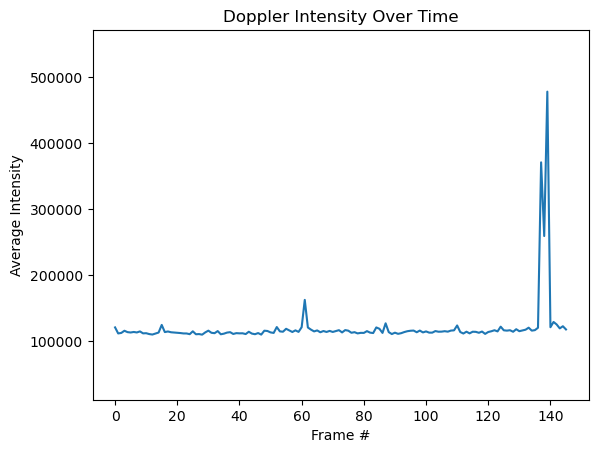

In [8]:
################################################
#     Display Doppler intensity time course    #
################################################
fusi_data = frames_data
average_over_time = np.mean(fusi_data, axis=(0, 1, 2))
plt.plot(average_over_time)
plt.title("Doppler Intensity Over Time")
plt.xlabel("Frame #")
plt.ylabel("Average Intensity")
# Calculate y-axis limits based on first 10 temporal points
first_10_mean = np.mean(average_over_time[:10])
y_min = first_10_mean * 0.1
y_max = first_10_mean * 5
plt.ylim(y_min, y_max)

Convert the pandas data structure into something importable to nilearn

(113, 51, 55, 130)


(11435.964848338546, 228719.2969667709)

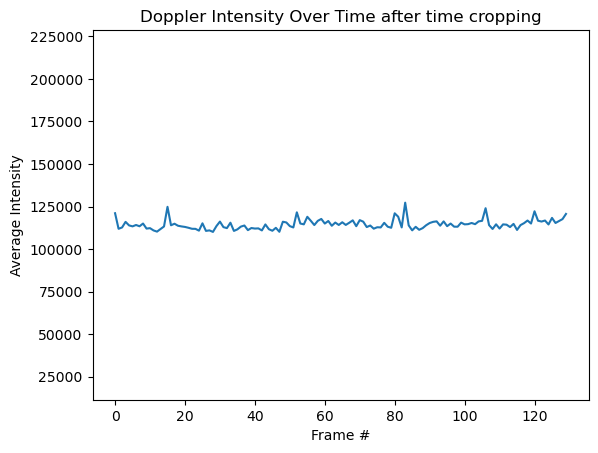

In [9]:
#######################################
#     Crop Power doppler acquisition   #
#######################################

# Load or create periods from JSON file
if not (base_path / "periods.json").exists():
    # Define periods as a list of tuples (start, end)
    periods = [
        (0, 59),
        (63, 134)
    ]
else:
    # Load existing periods from JSON file
    print("Loading quite periods already defined previously")
    with open(base_path / "periods.json", "r") as f:
        periods_dict = json.load(f)
        periods = periods_dict["periods"]

# Convert periods to slices and extract data
period_slices = [slice(start, end) for start, end in periods]
period_data = [fusi_data[:, :, :, period_slice] for period_slice in period_slices]

# Concatenate all periods
fusi_data_sub_period = np.concatenate(period_data, axis=3)
print(fusi_data_sub_period.shape)

average_over_time = np.mean(fusi_data_sub_period, axis=(0, 1, 2))
plt.plot(average_over_time)
plt.title("Doppler Intensity Over Time after time cropping")
plt.xlabel("Frame #")
plt.ylabel("Average Intensity")
# Calculate y-axis limits based on first 10 temporal points
first_10_mean = np.mean(average_over_time[:10])
y_min = first_10_mean * 0.1
y_max = first_10_mean * 2
plt.ylim(y_min, y_max)

In [10]:
#############################################################################################################################################
# Adjust probe_events and task_events to match the two periods defined for fusi_data #
#############################################################################################################################################

fusi_data = fusi_data_sub_period

# Convert periods to a dictionary for JSON serialization
periods_dict = {"periods": periods}
with open(base_path / "periods.json", "w") as f: # Save to JSON file
    json.dump(periods_dict, f)


# Extract probe events for each period and concatenate
probe_events.reset_index(drop=True, inplace=True)

probe_events_periods = [] # Create list to store probe events for each period
# Extract probe events for each period
for start, end in periods:
    period_slice = slice(start, end)
    probe_events_period = probe_events.iloc[period_slice].reset_index(drop=True)
    probe_events_periods.append(probe_events_period)

# Concatenate all periods
probe_events_sub_period = pd.concat(probe_events_periods).reset_index(drop=True)

# Sub-period of task events
last_valid_index = -1
for n in range(len(task_events)):
    if (
        task_events.iloc[n]["onset"] + task_events.iloc[n]["duration"]
        > probe_events_sub_period.iloc[-1]["time_stamp"]
    ):
        last_valid_index = n - 1
        break

# If no valid index is found, use all events; otherwise, slice up to the last valid index and reset index
if last_valid_index == -1:
    task_events_sub = task_events.copy().reset_index(drop=True)
else:
    task_events_sub = task_events.iloc[: last_valid_index + 1].reset_index(drop=True)

with open(base_path / "streams/task_events_sub.pkl", "wb") as f:
    pickle.dump(task_events_sub, f)
with open(base_path / "streams/probe_events_sub.pkl", "wb") as f:
    pickle.dump(probe_events_sub_period, f)

/var/folders/50/vlgy95sd2d1d6w1_l8pgqd1c0000gn/T/ipykernel_3040/2161090965.py:48: RuntimeWarning:

divide by zero encountered in log10



38.40599162800059
dynamic range:  16.200800660345635


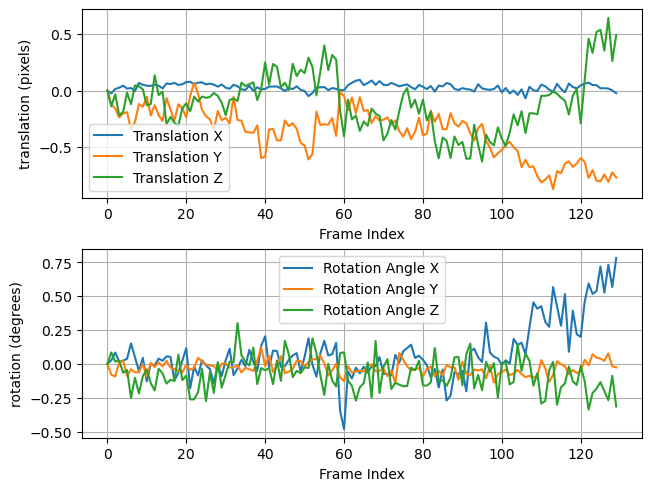

In [11]:
#########################################
#######  Rigid transformation  #########
########################################
transformation_file = base_path / "rigid_transformations.nii.gz"

if not transformation_file.exists():
    fusi_data_rigid_reg, rigid_transformations = utils.register_3d_image_stack(fusi_data)
    
    # Save rigid transformations to file
    # Create an affine transformation matrix with voxel sizes of 0.15mm 
    # (lambda at 4 MHz ~ 0.30mm. We reconstruct at lambda/2) in x,y,z,t dimensions)
    affine = np.diag([0.15, 0.15, 0.15, 1])
    nib.save(nib.Nifti1Image(rigid_transformations, affine), transformation_file)
    nib.save(nib.Nifti1Image(fusi_data_rigid_reg, affine), base_path / "fusi_data_rigid_reg.nii.gz")
else:
    # Load rigid transformations from file
    rigid_transformations = nib.load(transformation_file).get_fdata()
    fusi_data_rigid_reg = nib.load(base_path / "fusi_data_rigid_reg.nii.gz").get_fdata()

# Plot rigid_transformations
fig, axes = plt.subplots(nrows=2, ncols=1,layout="constrained")
ax_tran=axes[0]
ax_tran.plot(rigid_transformations[0, :], label="Translation X")
ax_tran.plot(rigid_transformations[1, :], label="Translation Y")
ax_tran.plot(rigid_transformations[2, :], label="Translation Z")
ax_tran.set_xlabel("Frame Index")
ax_tran.set_ylabel("translation (pixels)")
ax_tran.legend()
ax_tran.grid(True)
ax_tran.legend()

ax_rot=axes[1]
ax_rot.plot(rigid_transformations[3, :] * 180 / np.pi, label="Rotation Angle X")
ax_rot.plot(rigid_transformations[4, :] * 180 / np.pi, label="Rotation Angle Y")
ax_rot.plot(rigid_transformations[5, :] * 180 / np.pi, label="Rotation Angle Z")
ax_rot.set_xlabel("Frame Index")
ax_rot.set_ylabel("rotation (degrees)")
ax_rot.legend()
ax_rot.grid(True)
ax_rot.legend()



######################################################################
#     Display and save power Doppler movie after rigid registration  #
######################################################################

fusi_data_rigid_reg_dB = 10*np.log10(fusi_data_rigid_reg)
nnz_idx = fusi_data_rigid_reg > np.finfo(fusi_data_rigid_reg.dtype).eps
vmax = np.percentile(fusi_data_rigid_reg_dB[nnz_idx], 98)
vmin = np.percentile(fusi_data_rigid_reg_dB[nnz_idx], 2)
print(vmin)
print('dynamic range: ', vmax-vmin)

# Create figure and initial plot
fig, ax = plt.subplots()
cax = ax.imshow(
    fusi_data_rigid_reg_dB[:, int(fusi_data_rigid_reg_dB.shape[1] / 2), :, 0].T,
    cmap="inferno",
    extent=[0, 40, 35, 24],
)
ax.set_title("0")

# Set axis labels
ax.set_xlabel("Y (mm)")
ax.set_ylabel("X (mm)")
plt.colorbar(cax, ax=ax, label='Intensity (dB)')


def update(frame):
    cax.set_data(
        fusi_data_rigid_reg_dB[:, int(fusi_data_rigid_reg_dB.shape[1] / 2), :, frame].T
    )
    ax.set_title(f"Frame # {frame}")
    return (cax,)


# Create a list of frames to plot every other frame
frames_to_plot = range(0, fusi_data_rigid_reg.shape[3], 2)
ani = FuncAnimation(fig, update, frames=frames_to_plot, interval=100, blit=True)

# Save the animation as an MP4 file
ani.save(
    base_path / "Doppler_movie_after_rigid_registration.mp4",
    writer="ffmpeg",
)
# Display the animation in the Jupyter Notebook
plt.close()
display(HTML(ani.to_jshtml()))

/var/folders/50/vlgy95sd2d1d6w1_l8pgqd1c0000gn/T/ipykernel_3040/3032279526.py:33: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



<Figure size 640x480 with 0 Axes>

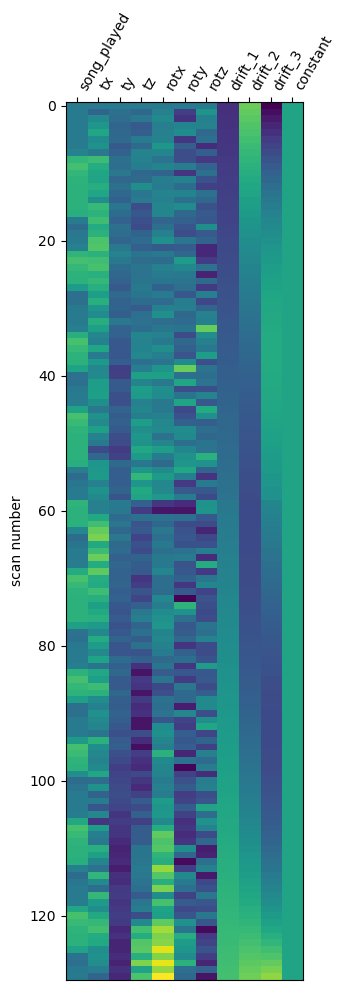

In [12]:
#######################################
#     Create design matrix for GLM    #
#######################################

fusi_data = fusi_data_rigid_reg  # If we're happy about the registration

regressed_with_transformations = True
event_time_offset = 1
task_events_sub["onset"] += event_time_offset

hrf_model = "glover"
if regressed_with_transformations:
    design_matrix = make_first_level_design_matrix(
        probe_events_sub_period["time_stamp"],
        task_events_sub,
        drift_model="polynomial",
        drift_order=3,
        add_regs=rigid_transformations.transpose(),
        add_reg_names=["tx", "ty", "tz", "rotx", "roty", "rotz"],
        hrf_model=hrf_model,
    )
else:
    design_matrix = make_first_level_design_matrix(
        probe_events_sub_period["time_stamp"],
        task_events_sub,
        drift_model="polynomial",
        drift_order=3,
        hrf_model=hrf_model,
    )

fig = plt.figure()
plot_design_matrix(design_matrix)
fig.show()

# Save design matrix as .npz file
np.savez(os.path.join(base_path, 'design_matrix.npz'), design_matrix=design_matrix.values, column_names=design_matrix.columns)


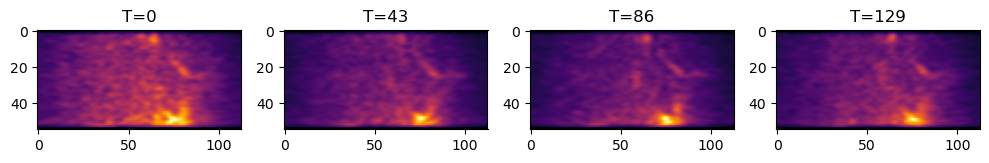

In [13]:
# Plot the data, make sure nothing crazy is happening, in particular, as I am mocking a 3D scan to play nice with nilearn, we need to make sure the data is in the right shape and the info across the second dimension is simply a copy
import matplotlib.pyplot as plt
# visualize to ensure we are getting what we think we should be getting!

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(10, 5))  # 4 columns for T dimension
for t_index, t_dim in enumerate(
    np.linspace(0, fusi_data.shape[3] - 1, 4, dtype=int)
):  # Sample 4 equally spaced indices along the T dimension
    ax = axs[t_index]
    img_plot = ax.imshow(
        fusi_data[:, fusi_data.shape[1] // 2, :, t_dim].transpose(), aspect="equal", cmap="inferno"
    )
    ax.set_title(f"T={t_dim}")

plt.tight_layout()
plt.show()

In [14]:
from nilearn.signal import butterworth


# pd=np.array(fusi_data)
def boxcar_smooth(data, window_size):
    if window_size > 0:
        smoothed_data = np.copy(data)
        for t in range(data.shape[3]):
            start_index = max(0, t - window_size // 2)
            end_index = min(data.shape[3], t + window_size // 2 + 1)
            smoothed_data[:, :, :, t] = np.mean(
                data[:, :, :, start_index:end_index], axis=3
            )
    else:
        smoothed_data = data
    return smoothed_data


window_size = 4  # Number of time points for smoothing
pd = boxcar_smooth(fusi_data, window_size)

# Create an affine transformation matrix with voxel sizes of 0.15mm 
# (lambda at 4 MHz ~ 0.30mm. We reconstruct at lambda/2) in x,y,z,t dimensions)
# This defines how the image data maps to real-world coordinates
affine = np.diag([0.15, 0.15, 0.15, 1])

# Create a NIfTI image object from our processed data (pd) and the affine matrix
fusi_img = nib.Nifti1Image(pd, affine)

# Save the NIfTI image to a compressed .nii.gz file in the base_path directory
fusi_img.to_filename(base_path / "fUSi_data_after_processing.nii.gz")

# Load the saved NIfTI image file (.nii.gz) from the base path into a NIfTI image object
# fusi_data = image.load_img(base_path / "fUSi_data_after_processing.nii.gz")
# fusi_data.shape

fusi_img.shape

(113, 51, 55, 130)

In [15]:
# This cell creates an identity matrix of size equal to the number of columns in the design_matrix.
# It then constructs a dictionary named 'basic_contrasts' where each key is a column name from the design_matrix
# and the corresponding value is a row from the identity matrix. This effectively sets up basic contrasts
# for each experimental condition represented in the design_matrix.

contrast_matrix = np.eye(design_matrix.shape[1])
contrasts = {
    column: contrast_matrix[i] for i, column in enumerate(design_matrix.columns)
}
contrasts

{'song_played': array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 'tx': array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 'ty': array([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.]),
 'tz': array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]),
 'rotx': array([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.]),
 'roty': array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.]),
 'rotz': array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]),
 'drift_1': array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]),
 'drift_2': array([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]),
 'drift_3': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]),
 'constant': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.])}

In [16]:
##########################################
## Create contrasts for localizer task ##
##########################################

def make_localizer_contrasts(design_matrix):
    contrast_matrix = np.eye(design_matrix.shape[1])
    contrasts = {
        column: contrast_matrix[i]
        for i, column in enumerate(design_matrix.columns)
    }

    contrasts["right_vs_left_wrist"] = (
        contrasts["right_wrist_motion"]
        - contrasts["left_wrist_motion"]
    )

    contrasts["right_wrist_vs_right_fingers"] = (
        contrasts["right_wrist_motion"]
        - contrasts["right_fingers_tapping"]
    )
    return contrasts
    
contrasts = make_localizer_contrasts(design_matrix)
contrasts

KeyError: 'right_wrist_motion'

In [17]:
from nilearn.glm.first_level import FirstLevelModel

# Initialize and fit the GLM model with specified parameters
print("Fitting a GLM")
fusi_glm = FirstLevelModel(
    minimize_memory=False,
    mask_img=False,
    smoothing_fwhm=smoothing_fwhm,
    standardize=True,
)
fusi_glm = fusi_glm.fit(fusi_img, design_matrices=design_matrix)

Fitting a GLM


Computing contrasts
	contrast id: song_played


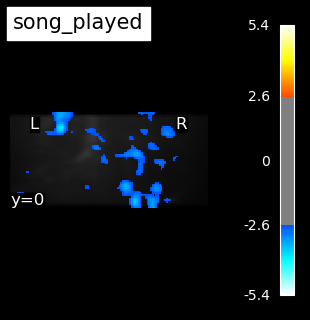

In [18]:
from nilearn import plotting
from nilearn.image import concat_imgs, mean_img, resample_img
import scipy.io
import os
import nibabel as nib
import numpy as np

print("Computing contrasts")
affine_zmap = np.diag([0.15, 0.15, 0.15, 1])
mean_image = nib.Nifti1Image(
    np.mean(fusi_img.get_fdata(), axis=-1), fusi_img.affine
)
os.makedirs(base_path, exist_ok=True)  # Create the directory if it doesn't exist


########################
# Iterate on contrasts #
########################

# Uncomment the line below to see all the contrasts
# for contrast_id, contrast_val in contrasts.items(): 

# Uncomment line below to see only the contrasts of the tasks and not the translations, rotations, etc ...
for contrast_id, contrast_val in {k: v for k, v in contrasts.items() if k not in ['tx', 'ty', 'tz', 'rotx', 'roty', 'rotz', 'drift_1', 'drift_2', 'drift_3', 'constant']}.items():    
    print(f"\tcontrast id: {contrast_id}")
    # compute the contrasts
    z_map = fusi_glm.compute_contrast(contrast_val, output_type="stat")

    # Get the data from z_map and create new NIfTI image
    z_map_data = z_map.get_fdata()
    nii_zmap = nib.Nifti1Image(z_map_data, affine_zmap)

    # Save the NIfTI zmap to a compressed .nii.gz file in the base_path
    output_path = os.path.join(base_path, f"{contrast_id}_z_map.nii.gz")
    nib.save(nii_zmap, output_path)

    # plot the contrasts as soon as they're generated
    # the display is overlaid on the mean fusi image
    # a threshold of 2.58 is used (corresponding to p < 0.01)
    plotting.plot_stat_map(
        z_map,
        bg_img=mean_image,
        threshold=2.58,
        cut_coords=[0],
        display_mode="y",
        black_bg=True,
        title=contrast_id,
    )
    plotting.show()

In [20]:
from nilearn.maskers import NiftiSpheresMasker
from nilearn.reporting import get_clusters_table

z_map = fusi_glm.compute_contrast("song_played")

threshold = 3.1

table = get_clusters_table(
    z_map, stat_threshold=threshold, cluster_threshold=20
)
table.set_index("Cluster ID", drop=True)
table.head()

# get the 6 largest clusters' max x, y, and z coordinates
coords = table.loc[range(1, 4), ["X", "Y", "Z"]].to_numpy()

# extract time series from each coordinate
# masker = NiftiSpheresMasker(coords)

masker = NiftiSpheresMasker(
    coords,
    radius=3,
    detrend=True,
    standardize="zscore",
    t_r=2.58,
    memory_level=1,
    verbose=0,
    allow_overlap=True,
)

real_timeseries = masker.fit_transform(fusi_img)
predicted_timeseries = masker.fit_transform(fusi_glm.predicted[0])

In [45]:
print(probe_events_periods.shape)


AttributeError: 'list' object has no attribute 'shape'

In [ ]:
print(predicted_timeseries.shape)

predicted_timeseries_DataFrame = pd.DataFrame(
    {
        "timestamp": probe_events_periods["timestamp"].values,
        **{f"predicted_timeseries_ROI_{i}": predicted_timeseries[:,i] 
           for i in range(predicted_timeseries.shape[1])}
    }
)

(130, 3)


ValueError: All arrays must be of the same length

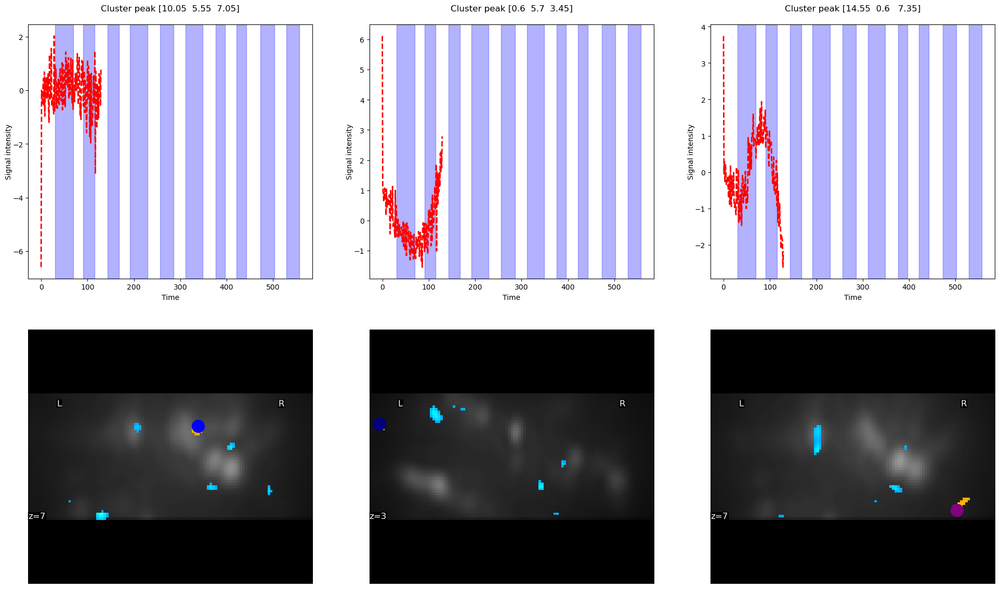

In [34]:
import matplotlib.pyplot as plt
from nilearn.plotting import plot_stat_map, show
import pandas as pd
# colors for each of the clusters
colors = ["blue", "navy", "purple", "magenta", "olive", "teal"]
task_colors = ['blue','purple', 'gray', 'lightgreen']

# plot the time series and corresponding locations
fig1, axs1 = plt.subplots(2, 3)
for i in range(3):
    # plotting time series
    axs1[0, i].set_title(f"Cluster peak {coords[i]}\n")
    # axs1[0, i].plot(real_timeseries[:, i], c=colors[i], lw=2)
    axs1[0, i].plot(predicted_timeseries[:, i], c="r", ls="--", lw=2)
    axs1[0, i].set_xlabel("Time")
    axs1[0, i].set_ylabel("Signal intensity", labelpad=0)
    
    # Add colored rectangles for stimulus periods
    task_list_type = task_events_sub.trial_type.unique()
    for task_index in range(len(task_list_type)):
        task = task_list_type[task_index]
        task_events_timing = pd.DataFrame()
        task_events_timing["Event"] = ["start", "stop"] * len(
            task_events_sub[task_events_sub["trial_type"] == task]
        )
        task_events_timing["Timestamp"] = [
            onset
            for onset, duration in zip(
                task_events_sub[task_events_sub["trial_type"] == task]["onset"],
                task_events_sub[task_events_sub["trial_type"] == task]["duration"],
            )
            for _ in range(2)
        ]
        task_events_timing.loc[task_events_timing["Event"] == "stop", "Timestamp"] += (
            task_events_sub[task_events_sub["trial_type"] == task]["duration"].values.repeat(1)
        )
        task_events_timing = task_events_timing.sort_values("Timestamp").reset_index(drop=True)
        start_times = task_events_timing[task_events_timing["Event"] == "start"]["Timestamp"]
        stop_times = task_events_timing[task_events_timing["Event"] == "stop"]["Timestamp"]
        for start, stop in zip(start_times, stop_times):
            axs1[0, i].axvspan(start, stop, color=task_colors[task_index], alpha=0.3, label=task if start == start_times.iloc[0] else "")
    
    # plotting image below the time series
    roi_img = plot_stat_map(
        z_map,
        cut_coords=[coords[i][2]],
        threshold=3.1,
        figure=fig1,
        axes=axs1[1, i],
        display_mode="z",
        colorbar=False,
        bg_img=mean_image,
    )
    roi_img.add_markers([coords[i]], colors[i], 300)
fig1.set_size_inches(24, 14)

show()